In [2]:
%load_ext autoreload
%autoreload 2

import pandas as pd
import lightgbm as lgb
import matplotlib.pyplot as plt
import shap
import numpy as np
import pandas as pd
import scipy
import seaborn as sns
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

from steps.prepare_data import load_split_processed_data, process_train_data, process_test_data
from utils.model import predict, load_model, Metrics, save_model, lgb_booster_to_model, load_final_model

from steps.prepare_data import load_split_processed_data, process_train_data, process_test_data
from utils.model import predict, load_model
from utils.model import predict, load_model, Metrics, save_model, load_final_model

THRESHOLD = 0.5

In [12]:
report = pd.DataFrame(
    {
        "name": [
            "Data",
            "(DropCorr) Data",
            "(DropCorr) Data + DPI",
            "(DropCorr) Data + DPI + FE",
            "(DropCorr, Smote) Data + DPI",
            "(DropCorr, Smote) Data + DPI + FE",
            "(DropCorr, Smote) Data + DPI + FE + FE (Total)",
            "ALL",
            "(Smote) ALL",
            "(Feature Selection) ALL",
            "(Smote, Feature Selection) ALL",
            "(Smote, NEW Feature Selection) ALL",
        ],
        "precision": [
            0.71,
            0.71,
            0.72,
            0.71,
            0.59,
            0.60,
            0.59,
            0.72,
            0.59,
            0.72,
            0.61,
            0.60,
        ],
        "recall": [
            0.32,
            0.32,
            0.30,
            0.32,
            0.43,
            0.42,
            0.42,
            0.31,
            0.43,
            0.30,
            0.43,
            0.43,
        ],
        "f1-score": [
            0.44,
            0.44,
            0.43,
            0.43,
            0.50,
            0.49,
            0.49,
            0.44,
            0.50,
            0.42,
            0.50,
            0.50,
        ],
        "AUC": [
            0.896,
            0.896,
            0.897,
            0.898,
            0.898,
            0.898,
            0.898,
            0.899,
            0.899,
            0.899,
            0.900,
            0.899,
        ],
        "Features count": [
            803,
            584,
            591,
            867,
            591,
            867,
            979,
            1666,
            1666,
            1104,
            1104,
            618,
        ],
    }
)


def highlight_row(row):
    if row.name == 11:
        return ["background-color: green"] * len(row)
    else:
        return [""] * len(row)


report["precision"] = report["precision"].astype(float).map(lambda x: f"{x:.2f}")
report["recall"] = report["recall"].astype(float).map(lambda x: f"{x:.2f}")
report["f1-score"] = report["f1-score"].astype(float).map(lambda x: f"{x:.2f}")
report["AUC"] = report["AUC"].astype(float).map(lambda x: f"{x:.3f}")

styled_df = report.style.apply(highlight_row, axis=1)

styled_df

,name,precision,recall,f1-score,AUC,Features count
0,Data,0.71,0.32,0.44,0.896,803
1,(DropCorr) Data,0.71,0.32,0.44,0.896,584
2,(DropCorr) Data + DPI,0.72,0.30,0.43,0.897,591
3,(DropCorr) Data + DPI + FE,0.71,0.32,0.43,0.898,867
4,"(DropCorr, Smote) Data + DPI",0.59,0.43,0.50,0.898,591
5,"(DropCorr, Smote) Data + DPI + FE",0.60,0.42,0.49,0.898,867
6,"(DropCorr, Smote) Data + DPI + FE + FE (Total)",0.59,0.42,0.49,0.898,979
7,ALL,0.72,0.31,0.44,0.899,1666
8,(Smote) ALL,0.59,0.43,0.50,0.899,1666
9,(Feature Selection) ALL,0.72,0.30,0.42,0.899,1104


In [3]:
# process_train_data()
# process_test_data()

In [4]:
from lightgbm import Booster
from sklearn.base import BaseEstimator, ClassifierMixin
import numpy as np


class Estimator:
    def __init__(self, model_name, threshold=0.5):
        model, features = load_final_model(model_name)
        self.model_name = model_name
        self.model = model
        self.features = features
        self.threshold = threshold

    def predict(self, X):
        y_pred_proba = self.predict_proba(X)

        return (y_pred_proba >= self.threshold).astype(int)

    def predict_proba(self, X):
        return self.model.predict_proba(X[self.features])[:, 1]

    def report(self, X, y):
        print(f"--------Model: {self.model_name} ------------")

        X = X[self.features]
        y_true = y

        y_pred_proba = self.predict_proba(X)
        y_pred = self.predict(X)

        Metrics().call(y_true, y_pred, y_pred_proba)


class EstimatorBooster(Estimator):
    def __init__(self, model_name, threshold=0.5):
        model, features = load_model(model_name)
        self.model_name = model_name
        self.model = model
        self.features = features
        self.threshold = threshold

    def predict(self, X):
        y_pred_proba = self.predict_proba(X)

        return (y_pred_proba >= self.threshold).astype(int)

    def predict_proba(self, X):
        return self.model.predict(X[self.features])

In [5]:
train_data, test_data = load_split_processed_data()

train_data_x = train_data.drop(columns=["target"])
train_data_y = train_data["target"]

test_data_x = test_data.drop(columns=["target"])
test_data_y = test_data["target"]

In [6]:
lgb_p071_r033_090auc = Estimator("1_BEST_LightGbmV2_new_total_features_p071_r033_090auc.pickle", threshold=THRESHOLD)
lgb_p060_r043_090auc = Estimator("2_BEST_LightGbmV2_new_total_features_p060_r043_090auc.pickle", threshold=THRESHOLD)
lgb_p063_r040_090auc = EstimatorBooster("3_BEST_LightGbmV2_new_feature_selection_v1_with_oversampling_v1_p063_040r_090auc.pickle", threshold=THRESHOLD)

In [76]:
lgb_p071_r033_090auc.report(test_data_x, test_data_y)
lgb_p060_r043_090auc.report(test_data_x, test_data_y)
lgb_p063_r040_090auc.report(test_data_x, test_data_y)

--------Model: 1_BEST_LightGbmV2_new_total_features_p071_r033_090auc.pickle ------------

Metrics
AUC: 0.90
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.99      0.97    140597
           1       0.71      0.33      0.45      9403

    accuracy                           0.95    150000
   macro avg       0.83      0.66      0.71    150000
weighted avg       0.94      0.95      0.94    150000

--------Model: 2_BEST_LightGbmV2_new_total_features_p060_r043_090auc.pickle ------------

Metrics
AUC: 0.90
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.98      0.97    140597
           1       0.60      0.43      0.50      9403

    accuracy                           0.95    150000
   macro avg       0.78      0.70      0.74    150000
weighted avg       0.94      0.95      0.94    150000

--------Model: 3_BEST_LightGbmV2_new_feature_selection_v1_with_oversampling_v1_p063_

In [77]:
first_preds = lgb_p071_r033_090auc.predict_proba(test_data_x)
second_preds = lgb_p060_r043_090auc.predict_proba(test_data_x)
third_preds = lgb_p063_r040_090auc.predict_proba(test_data_x)

y_pred_proba = 0.33 * first_preds + 0.33 * second_preds + 0.33 * third_preds
y_pred = (y_pred_proba >= THRESHOLD).astype(int)
y_true = test_data_y

Metrics().call(y_true, y_pred, y_pred_proba)


Metrics
AUC: 0.90
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.99      0.97    140597
           1       0.66      0.38      0.48      9403

    accuracy                           0.95    150000
   macro avg       0.81      0.68      0.73    150000
weighted avg       0.94      0.95      0.94    150000



(0.9029693081376478,
 '              precision    recall  f1-score   support\n\n           0       0.96      0.99      0.97    140597\n           1       0.66      0.38      0.48      9403\n\n    accuracy                           0.95    150000\n   macro avg       0.81      0.68      0.73    150000\nweighted avg       0.94      0.95      0.94    150000\n')

In [40]:
best_model = lgb_p060_r043_090auc

y_pred_proba = best_model.predict_proba(test_data_x)
y_pred = (y_pred_proba >= 0.5).astype(int)
y_true = test_data_y

Metrics().call(y_true, y_pred, y_pred_proba)


Metrics
AUC: 0.90
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.98      0.97    140597
           1       0.60      0.43      0.50      9403

    accuracy                           0.95    150000
   macro avg       0.78      0.70      0.74    150000
weighted avg       0.94      0.95      0.94    150000



(0.8995536702667641,
 '              precision    recall  f1-score   support\n\n           0       0.96      0.98      0.97    140597\n           1       0.60      0.43      0.50      9403\n\n    accuracy                           0.95    150000\n   macro avg       0.78      0.70      0.74    150000\nweighted avg       0.94      0.95      0.94    150000\n')

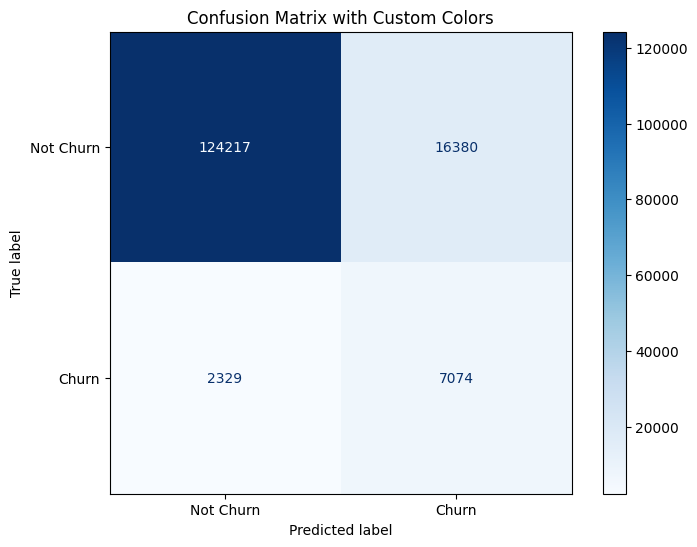

In [35]:
classes = ["Not Churn", "Churn"]

cm = confusion_matrix(y_true, y_pred)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
fig, ax = plt.subplots(figsize=(8, 6))
disp.plot(cmap="Blues", ax=ax)
plt.title("Confusion Matrix with Custom Colors")
plt.show()

Витрати на залучення нових клієнтів (5377 + 4026 = 9 403) більше ніж витртати на наявних юзерів (4026 + 2699 = 6 725)

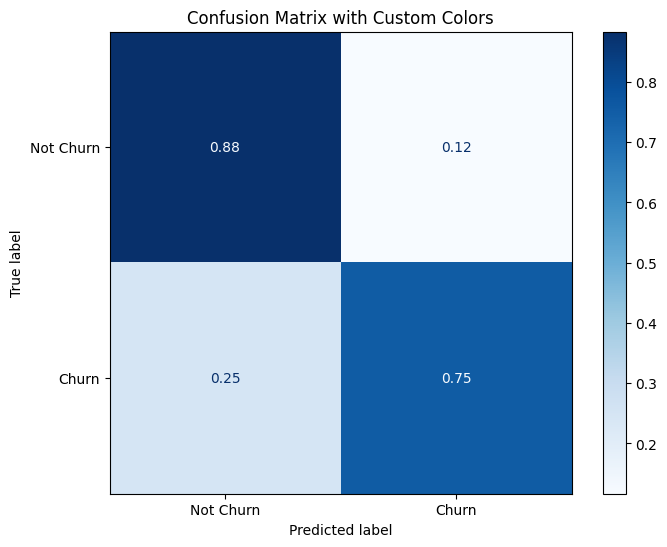

In [36]:
cm = confusion_matrix(y_true, y_pred, normalize="true")

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
fig, ax = plt.subplots(figsize=(8, 6))
disp.plot(cmap="Blues", ax=ax)
plt.title("Confusion Matrix with Custom Colors")
plt.show()

In [37]:
import plotly.express as px

pred_df = pd.DataFrame(
    {
        "y_pred_proba": y_pred_proba,
        "Churn": y_true.values,
    }
)

fig = px.histogram(
    pred_df,
    x="y_pred_proba",
    color="Churn",
    marginal="box",
    nbins=100,
    title="Distribution of predicted probabilities",
    color_discrete_map={0: "blue", 1: "red"},
)

fig.update_layout(bargap=0.1, xaxis_title="Predicted probability", yaxis_title="Count", legend_title="Class")

fig.update_layout(width=1200, height=600)

fig.show()

In [38]:
import plotly.express as px

pred_df = pd.DataFrame(
    {
        "y_pred_proba": y_pred_proba[y_true == 0],
        "Churn": y_true[y_true == 0].values,
    }
)

fig = px.histogram(
    pred_df,
    x="y_pred_proba",
    color="Churn",
    marginal="box",
    nbins=100,
    title="Distribution of predicted probabilities (Churn class)",
    color_discrete_map={0: "blue", 1: "red"},
)

fig.update_layout(
    bargap=0.1, xaxis_title="Predicted probability (Churn class)", yaxis_title="Count", legend_title="Class"
)

fig.update_layout(width=1000, height=600)

fig.show()

In [39]:
import plotly.express as px

pred_df = pd.DataFrame(
    {
        "y_pred_proba": y_pred_proba[y_true == 1],
        "Churn": y_true[y_true == 1].values,
    }
)

fig = px.histogram(
    pred_df,
    x="y_pred_proba",
    color="Churn",
    marginal="box",
    nbins=100,
    title="Distribution of predicted probabilities (Churn class)",
    color_discrete_map={0: "blue", 1: "red"},
)

fig.update_layout(
    bargap=0.1, xaxis_title="Predicted probability (Churn class)", yaxis_title="Count", legend_title="Class"
)

fig.update_layout(width=1000, height=600)

fig.show()

In [9]:
features = best_model.features
importances = best_model.model.booster_.feature_importance(importance_type="gain")
importance_df = pd.DataFrame(list(zip(features, importances)), columns=["Feature", "Importance"])

# Report
feature_importances = importance_df.sort_values(by="Importance", ascending=False)
feature_importances = feature_importances[feature_importances.Importance > 85]

feature_importances.Feature

0               num_act_days_min_mnt1
1                  device_brand_other
2               num_act_days_mea_mnt1
5                    device_sim_count
4               num_act_days_min_mnt3
                    ...              
617                  sms_clc_mea_diff
582    finance_topic_call_cnt_out_sum
584                abon_part_mea_mnt1
589              ks_num_part_min_diff
291            bs_delte_ppm_change_tp
Name: Feature, Length: 605, dtype: object

In [10]:
import plotly.express as px

fig = px.bar(feature_importances[:100], x="Importance", y="Feature", title="Feature Importances")
fig.update_layout(yaxis={"categoryorder": "total ascending"}, width=800, height=2000)
fig.show()

In [11]:
explainer = shap.TreeExplainer(best_model.model)
shap_values = explainer(train_data_x[best_model.features])

In [12]:
shap_importance = pd.DataFrame(
    list(zip(train_data_x.columns, np.abs(shap_values.values).mean(axis=0))), columns=["feature", "importance"]
).sort_values(by="importance", ascending=False)

shap_features = shap_importance[shap_importance.importance > 0.05]

shap_features

,feature,importance
1,device_brand_other,0.745914
0,num_act_days_min_mnt1,0.435403
5,device_sim_count,0.333136
11,active_ppm,0.309670
20,loc_market_share,0.239334
2,num_act_days_mea_mnt1,0.178996
4,num_act_days_min_mnt3,0.166584
6,device_type_smartphone,0.140427
12,MV_dou_net,0.131416
43,device_days_usage,0.124717


In [ ]:
# loc_market_share - Доля рынка Vodafone в регионе
# active_ppm - Признак активности пакета услуг на месяц
# MV_dou_net - кол-во_дней_пользования_сетевыми_услугами

# day_end_gba - дата окончания срока действия услуги Год без Абонплат (Потрібно клієнту щось пропонувати під кінець його підписки)

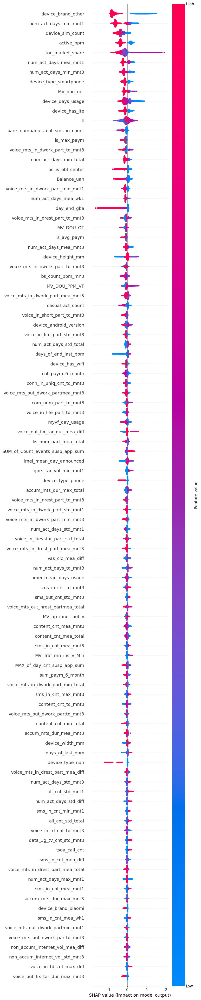

In [21]:
shap.summary_plot(shap_values, train_data_x[best_model.features], max_display=100, auto_size_plot=True)

In [24]:
feature_importances_nams = feature_importances["Feature"].values

def render_shap_plot(feature_name):
    shap.dependence_plot(feature_name, shap_values.values, train_data_x[best_model.features])

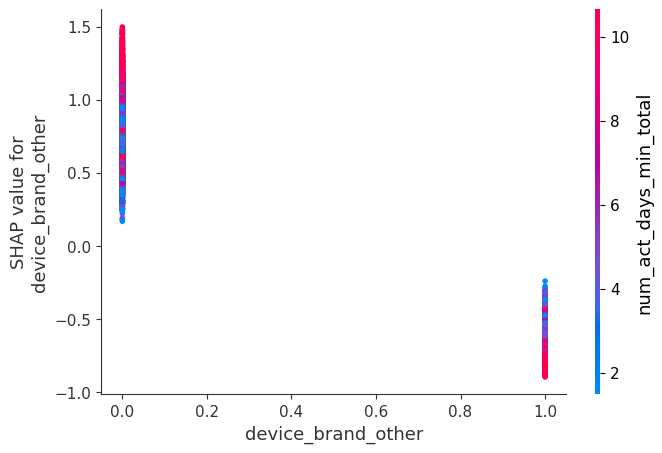

In [16]:
render_shap_plot(feature_importances_nams[1])

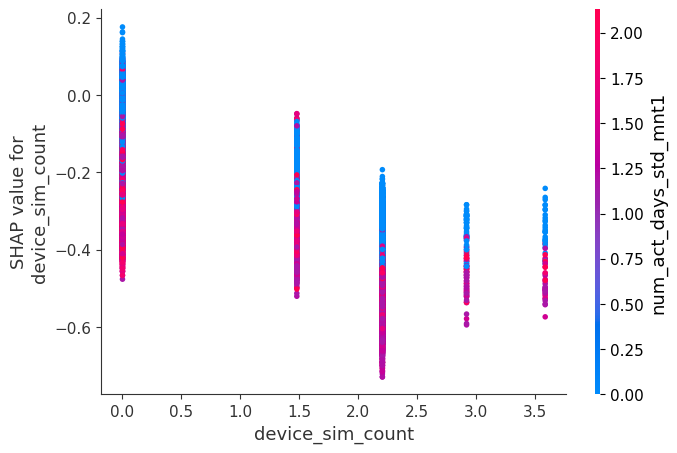

In [17]:
render_shap_plot(feature_importances_nams[3])

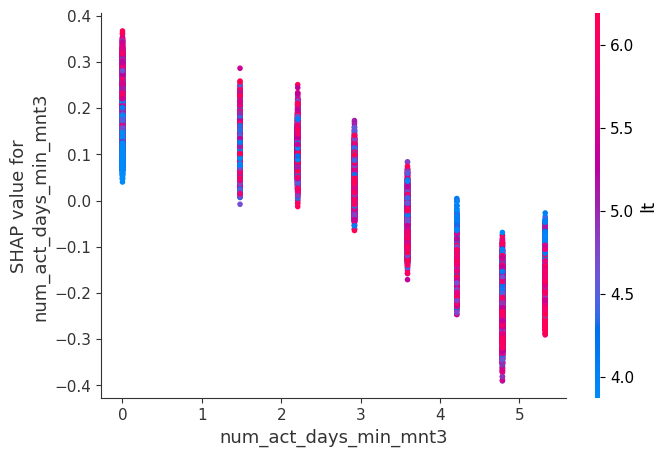

In [18]:
render_shap_plot(feature_importances_nams[4])

#### num_act_days_min_mnt3 VS it

- Клієнти з більшою мінімальною кількістю активних днів за три місяці мають меншу ймовірність відтоку (SHAP значення негативні).
- Клієнти з меншою мінімальною кількістю активних днів за три місяці мають більшу ймовірність відтоку (SHAP значення позитивні).
- Термін життя абонента додатково впливає на цей взаємозв'язок: клієнти з довшим терміном життя (червоні точки) менш ймовірно відтечуть, навіть при однакових значеннях num_act_days_min_mnt3.

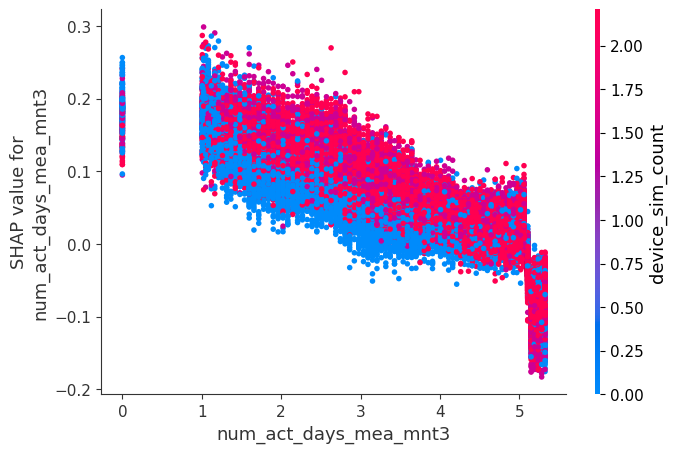

In [19]:
render_shap_plot(feature_importances_nams[5])

#### num_act_days_mea_mnt3 VS device_sim_count:

- В цілому, видно, що зі збільшенням num_act_days_mea_mnt3 SHAP значення зменшуються, що вказує на меншу ймовірність відтоку.
- Клієнти з більшою кількістю активних днів мають меншу ймовірність відтоку, і цей ефект може бути посилений або послаблений в залежності від кількості SIM-карток у пристрої.

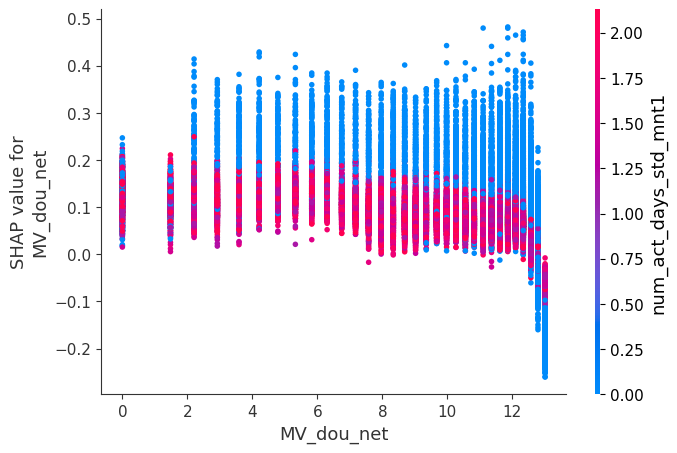

In [20]:
render_shap_plot(feature_importances_nams[6])

#### MV_dou_net VS num_act_days_std_mnt1

- Малий об'єм використання послуг збільшує ймовірність відтоку.
- Великий об'єм використаних послуг має різний вплив залежно від стандартного відхилення активних днів: низьке стандартне відхилення зменшує ймовірність відтоку, тоді як високе стандартне відхилення може збільшити цю ймовірність.

MV_dou_net - кол-во_дней_пользования_сетевыми_услугами


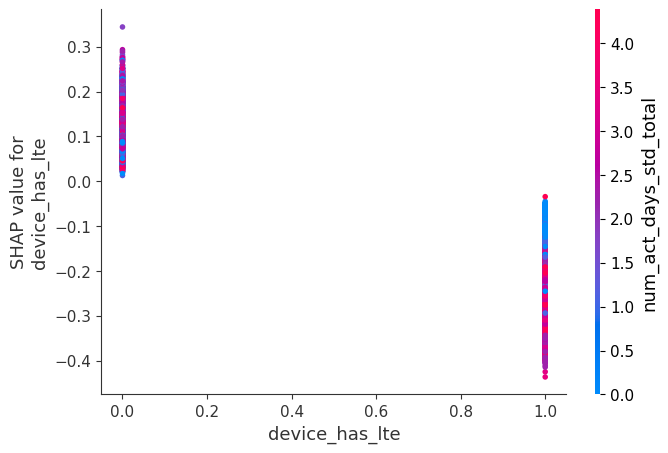

In [21]:
render_shap_plot(feature_importances_nams[7])

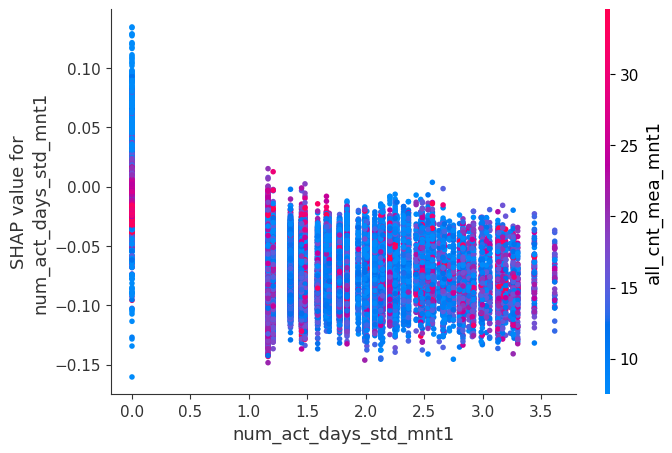

In [22]:
render_shap_plot(feature_importances_nams[8])

#### num_act_days_std_mnt1 VS all_cnt_mea_mnt1

- Клієнти зі стабільною кількістю активних днів за один місяць (низьке стандартне відхилення) мають меншу ймовірність відтоку (негативні SHAP значення).
- Клієнти з високим стандартним відхиленням активних днів за один місяць мають більш змішані результати, де ймовірність відтоку може бути як високою, так і низькою залежно від інших факторів, включаючи загальну кількість активних днів.

all_in_cnt_mea_mnt1 - 	Вся вхідна активність юзера

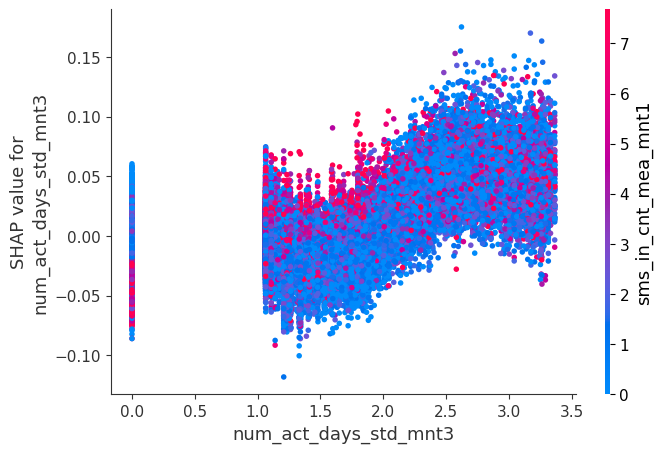

In [23]:
render_shap_plot(feature_importances_nams[9])

### sms_in_cnt_mea_mnt1 VS num_act_days_std_mnt3

- Стабільна кількість активних днів за три місяці знижує ймовірність відтоку клієнтів.
- Високе стандартне відхилення активних днів має варіативний вплив на ймовірність відтоку, що залежить від кількості вхідних SMS.
- Велика кількість вхідних SMS (червоні точки) при високому стандартному відхиленні активних днів може збільшити ймовірність відтоку, тоді як менша кількість вхідних SMS (сині точки) знижує цю ймовірність.

sms_in_cnt_mea_mnt1	Входящие SMS - стат.метрика